 **NLP PROJECT : 
PRAGER - D'ORSETTI
ENSAE 2022**

We focused on a project of classification based on a dataset containing tweets about the Olympic Games of Tokyo 2020. 

We looked at location prediction first, then related hashtag prediction for a given tweet. The dataset was not labellized so it was challenging to build such models. We will first present the data in order to better understand what it contains, then we will build two models and rely on issues that can be derived from it. 

This colab is ran with the git repository NLP_project. 
This repository is organized in the following way :     
- A configuration file : config.py
- A folder for preprocessing 
- A folder for labellizing the data
- A folder for the user location study, with the appropriate models and training. 
- A folder for the hashtag study. 

In order to use this repository, one needs to change the structure_dict, in the configuration file, in order to replace the path by the actual ones. 
One needs also the initial dataframe, which was pushed on github, and a configuration dictionnary in json format at the corresponding path in structure_dict, which stores the main arguments for the trainings.
Finally, the shapefiles of the world boundaries are mandatory. They are also pushed on github.
Once these settings done, it is easy to use the repository on this colab. It will store the results into the path written in the structure dict.
Don't hesitate to look at the project on github : https://github.com/sdorsetti/NLP_project.git

In [1]:
!pip install geopandas
!pip install langdetect
!pip install scikit-multilearn
!pip install spacymoji
!git clone --branch main --single-branch https://github.com/sdorsetti/NLP_project.git

     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 16.7 MB 331 kB/s 
     |████████████████████████████████| 6.3 MB 38.0 MB/s 
     |████████████████████████████████| 981 kB 5.8 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=f598a3e55185d0da1302a2f386d2fe6573757887d10c15681b2b9f781eb5d2ca
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect
     |████████████████████████████████| 89 kB 3.7 MB/s 
     |████████████████████████████████| 6.2 MB 4.5 MB/s 
     |████████████████████████████████| 51 kB 6.0 MB/s 
     |████████████████████████████████| 10.1 MB 26.5 MB/s 
     |████████████████████████████████| 457 kB 35.5 MB/s 
     |████████████████████████████████| 181 kB 40.0 MB/s 
     |████████████████████████████████| 42 kB 814 kB/s 
     |████████████████████████████████| 653 kB 40.9 MB/s 
     |██████████

In [2]:
import pandas as pd
import seaborn as sns
import ast
from geopy.extra.rate_limiter import RateLimiter
from collections import Counter
from geopy.geocoders import Nominatim
from shapely.geometry import Point, Polygon
import geopandas as gpd
import geopy 
from tqdm import tqdm
import numpy as np
import folium
import functools
from folium.plugins import FastMarkerCluster
from gensim.models.phrases import Phrases, Phraser
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, plot_roc_curve
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly
from wordcloud import WordCloud,STOPWORDS
from PIL import Image
import json
import torch
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import TweetTokenizer
import re
import spacy
from spacymoji import Emoji
import warnings
from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [3]:
from google.colab import drive
drive.mount("/content/gdrive/")

Mounted at /content/gdrive/


In [4]:
path = "/content/gdrive/MyDrive/cours/ensae/NLP/"
output_path = path+"output/"

# 1. Database import / Descriptive Statistics

## Import

In [5]:
df = pd.read_csv(f"{path}tokyo_2020_tweets.csv")

In [ ]:
print(f"The dataframe contains {df.shape[0]} tweets described by their {','.join(list(df.columns))}")

The dataframe contains 15501 tweets described by their id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet


Let's see how looks like the first lines of the dataframe

In [ ]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1418888645105356803,Abhishek Srivastav,"Udupi, India",Trying to be mediocre in many things,2021-02-01 06:33:51,45,39,293,False,2021-07-24 10:59:49,Let the party begin\n#Tokyo2020,['Tokyo2020'],Twitter for Android,0,0,False
1,1418888377680678918,Saikhom Mirabai Channu🇮🇳,"Manipur, India",Indian weightlifter 48 kg category. Champion🏆,2018-04-07 10:10:22,5235,5,2969,False,2021-07-24 10:58:45,Congratulations #Tokyo2020 https://t.co/8OFKMs...,['Tokyo2020'],Twitter for Android,0,0,False
2,1418888260886073345,Big Breaking,Global,All breaking news related to Financial Market....,2021-05-29 08:51:25,3646,3,5,False,2021-07-24 10:58:17,Big Breaking Now \n\nTokyo Olympic Update \n\n...,NaN,Twitter for Android,0,1,False
3,1418888172864299008,International Hockey Federation,Lausanne,Official International Hockey Federation Twitt...,2010-10-20 10:45:59,103975,2724,36554,True,2021-07-24 10:57:56,Q4: 🇬🇧3-1🇿🇦\n\nGreat Britain finally find a wa...,NaN,Twitter Web App,1,0,False
4,1418886894478270464,Cameron Hart,Australia,Football & Tennis Coach,2020-10-31 08:46:17,6,37,31,False,2021-07-24 10:52:51,All I can think of every time I watch the ring...,"['Tokyo2020', 'ArtisticGymnastics', '7Olympics...",Twitter for iPhone,0,0,False


## Missing values

In [ ]:
print(f"There are {len(df) - len(df.dropna())} lines containing non assigned values")

There are 6868 lines containing non assigned values


Let's see where these missing values are localized :

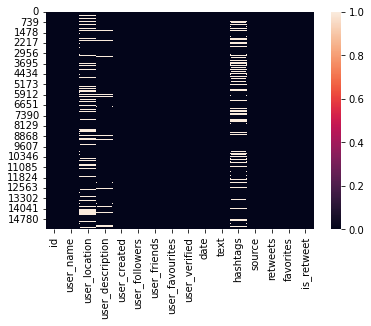

In [ ]:
sns.heatmap(df.isnull())

We see that it is mainly on the column user_location and hashtags that these valus are missing. This ascertainment was the starting point of our reflexion on the database. 

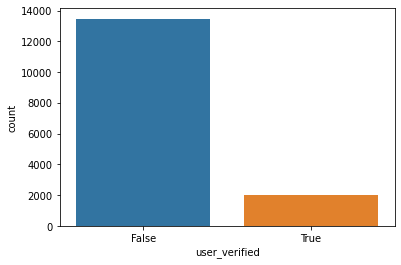

In [ ]:
sns.countplot(x="user_verified", data=df)

In [ ]:
df.describe()

,id,user_followers,user_friends,user_favourites,retweets,favorites
count,1.550100e+04,1.550100e+04,15501.000000,1.550100e+04,15501.000000,15501.000000
mean,1.418886e+18,8.815629e+04,1127.865299,1.926456e+04,2.069092,12.516289
std,2.073965e+13,8.625003e+05,3148.734786,4.855550e+04,27.893370,183.116364
min,1.418859e+18,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
25%,1.418869e+18,1.040000e+02,133.000000,5.800000e+02,0.000000,0.000000
50%,1.418881e+18,5.320000e+02,450.000000,3.881000e+03,0.000000,0.000000
75%,1.418897e+18,2.661000e+03,1134.000000,1.620300e+04,0.000000,2.000000
max,1.418928e+18,4.321674e+07,170966.000000,1.226661e+06,2049.000000,12990.000000


When did these tweets were written ? 

In [7]:
df["date"].iloc[0]

'2021-07-24 10:59:49'

In [9]:
df_date = df.copy()
df_date["day"] = df_date["date"].apply(lambda x : x.split(" ")[0])
df_date["hour"] = df_date["date"].apply(lambda x : x.split(" ")[-1].split(":")[0])
df_date["precise_hour"] = df_date["date"].apply(lambda x : ":".join(x.split(" ")[-1].split(':')[:2]))

In [22]:
fig = px.bar(df_date.groupby("precise_hour",as_index=False).count(), x = "precise_hour",y ="text", title = "number of tweets every minutes")
fig.show()

In [11]:
fig = px.line(df_date.groupby("hour",as_index=False).count(), x = "hour",y ="text", title = "number of tweets by hour")
fig.show()

The tweets only come from in the morning 5 hours

In [12]:
df_date["day"].unique()

array(['2021-07-24'], dtype=object)

They were all written on July the 24th

The numeric columnss did not seem to be very interesting. We focused therefore on the 2 columns with missing values, with the idea of buiding a model able to fullfill these missing values. 

# 2. User Location Prediction

First of all, we aimed to build a model able to predict the location of the tweet, the main issue being that the column user_location contains many different location names but a lot of them refer to the same place. 

In [ ]:
print(f"There are {len(df['user_location'].unique())} unique locations")

There are 4146 unique locations


We needed therefore to unify these location and group them under a few list of labels. 

## Preprocessing, cleaning

In [25]:
from NLP_project.preprocess.preprocess import DataPreprocessor

The column with the text needs to be cleaned. We propose to remove hashtags, emojis, html signs etc... and use a tokenisation (TweetTokenizer). We also use the package detectlang in order to remove non-english tweets

In [ ]:
df["text"]

0                          Let the party begin\n#Tokyo2020
1        Congratulations #Tokyo2020 https://t.co/8OFKMs...
2        Big Breaking Now \n\nTokyo Olympic Update \n\n...
3        Q4: 🇬🇧3-1🇿🇦\n\nGreat Britain finally find a wa...
4        All I can think of every time I watch the ring...
                               ...                        
15496    Wow !! Iran beats Poland 😊\n#volleyball #Olymp...
15497    Excitement at the Manipur residence of @miraba...
15498    Shout out to Own Goal. Disappointed in Offside...
15499    #IRI pulls off the upset on their 7th match po...
15500    the lakes #Tokyo2020 #Olympics fear street you...
Name: text, Length: 15501, dtype: object

In [ ]:
preprocessor = DataPreprocessor(df,"text")
df_loc = preprocessor.get_df(to_csv=True, remove_emojis=False)

  9%|▉         | 1390/15501 [00:10<01:23, 169.40it/s]

unreconnized character
unreconnized character


 12%|█▏        | 1918/15501 [00:14<01:50, 123.28it/s]

unreconnized character


 14%|█▍        | 2143/15501 [00:15<01:22, 161.00it/s]

unreconnized character


 16%|█▌        | 2425/15501 [00:17<01:21, 159.52it/s]

unreconnized character


 19%|█▉        | 2907/15501 [00:21<01:18, 160.80it/s]

unreconnized character


 19%|█▉        | 2943/15501 [00:21<01:18, 159.41it/s]

unreconnized character


 19%|█▉        | 3006/15501 [00:21<01:29, 139.80it/s]

unreconnized character


 21%|██        | 3247/15501 [00:23<01:13, 166.67it/s]

unreconnized character


 23%|██▎       | 3501/15501 [00:25<01:16, 157.43it/s]

unreconnized character


 25%|██▌       | 3887/15501 [00:27<01:13, 158.61it/s]

unreconnized character


 31%|███       | 4836/15501 [00:33<01:11, 148.99it/s]

unreconnized character


 32%|███▏      | 4955/15501 [00:34<01:09, 150.71it/s]

unreconnized character


 33%|███▎      | 5164/15501 [00:36<01:10, 145.80it/s]

unreconnized character


 37%|███▋      | 5778/15501 [00:40<01:10, 138.18it/s]

unreconnized character


 38%|███▊      | 5856/15501 [00:41<01:13, 132.07it/s]

unreconnized character


 39%|███▉      | 6109/15501 [00:42<01:05, 143.79it/s]

unreconnized character


 45%|████▍     | 6968/15501 [00:51<01:03, 133.95it/s]

unreconnized character


 47%|████▋     | 7260/15501 [00:53<01:02, 132.05it/s]

unreconnized character


 47%|████▋     | 7338/15501 [00:54<00:56, 145.72it/s]

unreconnized character


 53%|█████▎    | 8187/15501 [01:00<00:45, 161.61it/s]

unreconnized character


 59%|█████▉    | 9117/15501 [01:06<00:39, 162.99it/s]

unreconnized character


 67%|██████▋   | 10410/15501 [01:15<00:39, 129.52it/s]

unreconnized character


 70%|███████   | 10886/15501 [01:19<00:28, 162.61it/s]

unreconnized character


 75%|███████▍  | 11611/15501 [01:23<00:24, 160.31it/s]

unreconnized character


 75%|███████▌  | 11685/15501 [01:24<00:22, 173.17it/s]

unreconnized character


 75%|███████▌  | 11703/15501 [01:24<00:22, 168.22it/s]

unreconnized character


 80%|████████  | 12403/15501 [01:29<00:22, 139.56it/s]

unreconnized character


 81%|████████  | 12544/15501 [01:30<00:17, 172.32it/s]

unreconnized character


 91%|█████████ | 14099/15501 [01:43<00:10, 131.42it/s]

unreconnized character


 94%|█████████▍| 14589/15501 [01:46<00:05, 161.97it/s]

unreconnized character


100%|██████████| 15501/15501 [01:52<00:00, 137.69it/s]


In [ ]:
df_loc[["text", "cleaned_text"]]

,text,cleaned_text
0,Let the party begin\n#Tokyo2020,let the party begin
1,Congratulations #Tokyo2020 https://t.co/8OFKMs...,congratulations
2,Big Breaking Now \n\nTokyo Olympic Update \n\n...,big breaking now tokyo olympic update japan wo...
3,Q4: 🇬🇧3-1🇿🇦\n\nGreat Britain finally find a wa...,q4 : 🇬_🇧 3-1 🇿_🇦 great_britain finally find a ...
4,All I can think of every time I watch the ring...,all i can think of every time i watch the ring...
...,...,...
15496,Wow !! Iran beats Poland 😊\n#volleyball #Olymp...,wow ! ! iran beats poland 😊
15497,Excitement at the Manipur residence of @miraba...,excitement at the manipur residence of as she ...
15498,Shout out to Own Goal. Disappointed in Offside...,shout out to own_goal . disappointed in offsid...
15499,#IRI pulls off the upset on their 7th match po...,pulls off the upset on their 7th match point t...


We have now a new dataframe with a clean column. We lost line because of the language detection part

In [ ]:
print(f"We lost {round((1 - df_loc.shape[0]/df.shape[0])*100,3)} % of the lines, because these were non english lines")

We lost 10.09 % of the lines, because these were non english lines


### ShowPhraser

We would like to see expressions commonly used with a multi-words expression detector :  

In [13]:
def show_phrases(tokenized_sentences, threshold=10, shown=15):
  phrases = Phrases(tokenized_sentences, threshold=threshold)
  i = 0
  for phrase, score in phrases.export_phrases(tokenized_sentences):
    if i>shown:
      break
    else:
      print("Expression : {0}, score = {1}".format(phrase, score))
    i=i+1

In [27]:
tok = TweetTokenizer()
show_phrases(df_loc["cleaned_text"].apply(lambda x : tok.tokenize(x)))

100%|██████████| 15501/15501 [00:04<00:00, 3854.56it/s]


Expression : b"men's 60_kg", score = 44.52141608391609
Expression : b'q4 :', score = 13.949650796549047
Expression : b'\xf0\x9f\x87\xac _', score = 13.610807756890171
Expression : b'\xf0\x9f\x87\xbf _', score = 13.573496122910948
Expression : b'every time', score = 30.01073232323232
Expression : b'rings event', score = 16.54727095516569
Expression : b'women empowerment', score = 42.18012422360249
Expression : b'6 goals', score = 50.59280544912728
Expression : b'goal difference', score = 17.53873966942149
Expression : b"caloy yulo's", score = 138.21573948439618
Expression : b'\xf0\x9f\x87\xa8 _', score = 10.614121736520955
Expression : b'\xf0\x9f\x87\xa6 1-4', score = 24.498556998556996
Expression : b'live_scorecard on', score = 31.980905899477694
Expression : b'hearty congratulations', score = 43.43300795789341
Expression : b'to indian_railways', score = 12.655019799673887
Expression : b'\xf0\x9f\x8f\x8b _', score = 18.54499349804941


## Labellisation

The following step was to labllize the tweets. As claimed before, we faced the problem of the many locations used by the tweetos. There are many cases. For example: 
- One can write as a user location "India"
- But also "West Bengal, India"
- "Calcutta, India"
- "Calcutta"
- "Colcatta"
- "india" 
- an emoji with the Indian flag
- nothing
-"At home" 

So wee see that, for one same location, there are many ways to define. How can we unify all these locations under a few list of labels ? And which labels do we need to choose ? 

To answer this question, we need to see where approximatively the tweets mainly come from. 

We parse the location with geopy and plot for the random few lines to get an idea. 

In [ ]:
locator = geopy.geocoders.Nominatim(user_agent="mygeocoder")
geocode = RateLimiter(locator.geocode, min_delay_seconds=1)

In [ ]:
l = []
folium_map = folium.Map(location=[59.338315,18.089960],
zoom_start=2,
tiles="CartoDB dark_matter")
for loc in tqdm(np.random.choice(df_loc["user_location"],size=200)):
  try : 
    a = geocode(loc)
  except : 
    continue 
  if a!= None:
    l.append(a[-1])


FastMarkerCluster(data = l).add_to(folium_map)
folium.LayerControl().add_to(folium_map)
folium_map

100%|██████████| 200/200 [03:59<00:00,  1.20s/it]


We see that the tweets are quite locallized. There is a big part of them who issued from India. But we see also that some comes from Australia, Eastern Asia, Europe and North America.

The following step that we took was to apply a Named Entity Recognition algorithm on the user location in order to parse them and keep only the rows with location corresponding to real places in the world. We could have done that also with geopy but we wanted to test the NER method.

We implemented a useful object to help us doing the labelization :

In [ ]:
from NLP_project.labellisation.labellisation import Labelizer

In [ ]:
lab = Labelizer(df_loc, "user_location")

In [ ]:
#Process df with a NER
ner = lab.apply_ner_
print(f"there are {df_loc.shape[0] - lab.drop_unexistent_locations(ner).shape[0]} false locations (unexistent or non assigned), corresponding to {round((lab.drop_unexistent_locations(ner).shape[0] / df_loc.shape[0])*100,3)} % of the rows")

100%|██████████| 13937/13937 [01:44<00:00, 133.89it/s]


there are 6821 false locations (unexistent or non assigned), corresponding to 51.058 % of the rows


In [ ]:
ner

[['Udupi', 'India'],
 ['India'],
 [],
 [],
 ['Australia'],
 [],
 [],
 [],
 ['Puttur', 'Karnataka', 'India'],
 [],
 [],
 ['India'],
 [],
 [],
 [],
 [],
 [],
 [],
 ['Gujarat', 'India'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['Sydney', 'New South Wales'],
 ['Philippines'],
 ['New Delhi', 'India'],
 [],
 [],
 ['Bangalore', 'India'],
 ['India'],
 [],
 [],
 ['UK'],
 [],
 [],
 ['Mumbai', 'India'],
 ['Delhi', 'Mumbai'],
 [],
 ['Hyderabad', 'India'],
 ['London'],
 [],
 ['Darlington', 'England'],
 ['Johannesburg', 'South Africa'],
 ['Sydney', 'New South Wales'],
 [],
 [],
 ['India'],
 [],
 [],
 ['London'],
 ['Uttar', 'India'],
 ['New Delhi', 'India'],
 [],
 ['France'],
 [],
 ['England'],
 [],
 ['India'],
 [],
 ['New Delhi', 'India'],
 [],
 ['Hyderabad', 'India'],
 ['India'],
 ['Itanagar', 'India'],
 [],
 [],
 ['Manila', 'Philippines'],
 [],
 [],
 [],
 [],
 [],
 ['India'],
 [],
 [],
 ['India'],
 [],
 [],
 ['Sanford', 'NC'],
 ['Beijing', 'PRC'],
 ['India'],
 [],
 ['The Netherlands'],
 [],
 [],
 [],


The NER function that we apply, parses the locations, and keeps only the locations correspondig to a recognized place.

Now that this work is done, we can labellize on the remaining rows. There are two options for the labellization. 
- We can either define regions by hand, in a dictionnary (see below) 
- Or imports shapefiles of the continents and assign a location to a label if it is in the shapefile. This is the best option, because we are sure to miss not a single location.

We decided to focus on 4 labels, based on the map  : America, Australia, Europe and India

In [ ]:
shp = gpd.read_file( "/content/NLP_project/data/shapefiles/world-administrative-boundaries.shp")

We join the polygons to get a geodataframe with the polygons associated to our labels. 

In [ ]:
continents = shp.dissolve(by = "continent",as_index=False)

In [ ]:
final = pd.concat([continents[continents["continent"].isin(["Americas", "Europe","Oceania"])], shp[shp["name"] == "India"]])
final["continent"] = ["Americas","Europe","Oceania","India"]

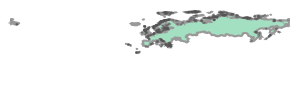

In [ ]:
final.iloc[1,1]

In [ ]:
final.iloc[0,1]

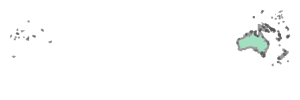

In [ ]:
final.iloc[2,1]

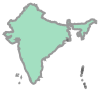

In [ ]:
final.iloc[3,1]

We created a function that labellizes a location, starting from a string.

In [ ]:
lab.label_location("calcutta",final,{})

'India'

In [ ]:
lab.label_location("West Bengal",final,{})

'India'

In [ ]:
lab.label_location("Somewere on earth",final,{})

'Unknown'

In [ ]:
lab.label_location("Johannesburg",final,{})

'Location not in labels'

We can now apply this function to all location, sorted with the NER

In [ ]:
tqdm.pandas()
df_labelled = lab.get_df(to_csv=True, shp=final)

100%|██████████| 7116/7116 [12:32<00:00,  9.46it/s]


We saved the association between string and the continent into a dictionnary locallized at [path] + "history.json". The function takes indeed a lot of time to run, because geopy needs time to parse the string. Therefore, once the function is ran, it can be ran again very quickly with the history file. 

We can now look at the "real" distribution of localisation:

In [ ]:
fig = px.bar(df_labelled.groupby("label",as_index=False).count(), x = "label", y = "text", title = "Repartition of labels")
fig.show()

As we observed on a little slice of the data, we have an overrepresentation of indian tweets. We will use an oversampler in order to train on well balanced data. 

## Modelisation

In this part, we first present the general idea and then, for each set of parameters considered, we copy the config dictionnary with all the parameters of the model in a cell, train the model, and show the results

For our modellisation, we considered many options. First, we implmented a neural network with 3 linear hidden layer, relu functions and a softmax layer to get a prediction of the class.
We also chose to use an embedding, from torch fastext, with pretrained vectors. 
We have a configuration dictionnary that allows us to move the parameters associated to the training. Here is this dictionnary : 

In [ ]:
{
    "optim": "SGD",
    "device": "cuda",
    "num_workers": 2,
    "bsize": 16,
    "test_split": 0.3,
    "num_epochs": 100,
    "learning_rate": 0.001,
    "momentum": 0.9,
    "architecture": "arch1",
    "model_name": "baseline",
    "num_class": 4,
    "hidden_dim": 300,
    "output_dim": 4
}

{'architecture': 'arch1',
 'bsize': 16,
 'device': 'cuda',
 'hidden_dim': 300,
 'learning_rate': 0.001,
 'model_name': 'baseline',
 'momentum': 0.9,
 'num_class': 4,
 'num_epochs': 100,
 'num_workers': 2,
 'optim': 'SGD',
 'output_dim': 4,
 'test_split': 0.3}

The main idea is that the text would change depending on where the tweet comes from. We can verify this assumption with some wordclouds

### Wordclouds

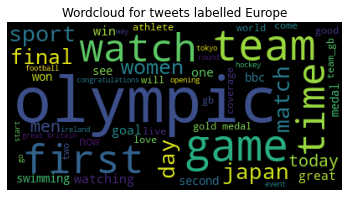

In [ ]:
label = "Europe"
sample = " ".join(list(df_labelled[df_labelled["label"] == label]["cleaned_text"]))
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud for tweets labelled {}".format(label))
plt.axis("off")
plt.show();

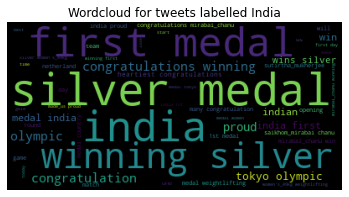

In [ ]:
label = "India"
sample = " ".join(list(df_labelled[df_labelled["label"] == label]["cleaned_text"]))
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud for tweets labelled {}".format(label))
plt.axis("off")
plt.show();


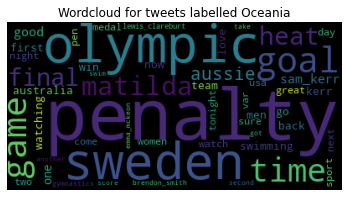

In [ ]:
label = "Oceania"
sample = " ".join(list(df_labelled[df_labelled["label"] == label]["cleaned_text"]))
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud for tweets labelled {}".format(label))
plt.axis("off")
plt.show();

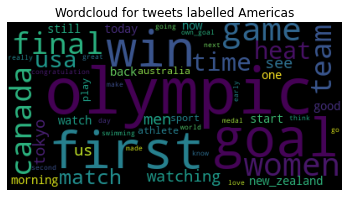

In [ ]:
label = "Americas"
sample = " ".join(list(df_labelled[df_labelled["label"] == label]["cleaned_text"]))
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud for tweets labelled {}".format(label))
plt.axis("off")
plt.show();

The following command line will load torch datasets and train with the label. The results and output are automatically saved during the process, for each epoch in the output path. We will display them after training

### Stochastic Gradient Descent

In [ ]:
%run /content/NLP_project/user_location/train/train.py

 20%|██        | 20/100 [01:13<04:44,  3.56s/it]/content/NLP_project/user_location/modelisation/utils.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,15))
100%|██████████| 100/100 [06:07<00:00,  3.67s/it]


In [ ]:
with open(f"{output_path}pred.json") as f:
    preds = json.load(f)
    f.close()
label = ["Americas","Europe","Oceania","India"]
print(classification_report(np.array(preds["trues"]).flatten(), np.array(preds["preds"]).flatten(), target_names=label))

              precision    recall  f1-score   support

    Americas       0.55      0.56      0.55       920
      Europe       0.33      0.68      0.45       919
     Oceania       0.30      0.28      0.29       921
       India       0.80      0.01      0.02       920

    accuracy                           0.38      3680
   macro avg       0.50      0.38      0.33      3680
weighted avg       0.50      0.38      0.33      3680



In [ ]:
print(f"The Overall accuracy of this model is {preds['acc_it_avg']}")

The Overall accuracy of this model is 0.3826086956521739


The results with the Stochastic Gradient Descent are disappointing. We want to retry with the Adam Optimizer.

### Adam Optimizer

In [ ]:
{
    "optim": "Adam",
    "device": "cuda",
    "num_workers": 2,
    "bsize": 16,
    "test_split": 0.3,
    "num_epochs": 100,
    "learning_rate": 0.001,
    "momentum": 0.9,
    "architecture": "arch1",
    "model_name": "baseline",
    "num_class": 4,
    "hidden_dim": 300,
    "output_dim": 4
}

In [ ]:
%run /content/NLP_project/user_location/train/train.py

  0%|          | 0/100 [00:00<?, ?it/s]/content/NLP_project/user_location/modelisation/utils.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,15))
100%|██████████| 100/100 [08:44<00:00,  5.24s/it]


In [ ]:
with open(f"{output_path}pred.json") as f:
    preds = json.load(f)
    f.close()
label = ["Americas","Europe","Oceania","India"]
print(classification_report(np.array(preds["trues"]).flatten(), np.array(preds["preds"]).flatten(), target_names=label))


              precision    recall  f1-score   support

    Americas       0.69      0.71      0.70       919
      Europe       0.64      0.57      0.60       920
     Oceania       0.49      0.53      0.51       920
       India       0.58      0.57      0.57       921

    accuracy                           0.59      3680
   macro avg       0.60      0.59      0.60      3680
weighted avg       0.60      0.59      0.59      3680



In [ ]:
print(f"The Overall accuracy of this model is {preds['acc_it_avg']}")

The Overall accuracy of this model is 0.5942934782608695


<br>
<img src='https://drive.google.com/uc?id=13DR-AnC0elXUKPPF4fF9iyAxGfiYnohe'>

We might have underwent an overfitting

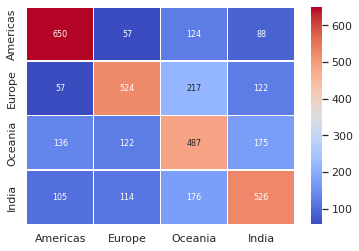

In [ ]:
plt.figure()
cm = confusion_matrix(np.array(preds["trues"]).flatten(), np.array(preds["preds"]).flatten())
df_cm = pd.DataFrame(cm, index=label, columns=label)
# config plot sizes
sns.set(font_scale=1)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 8}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

The results are definetly better. They are still perfectible. We trained here the model from the column "cleaned_text". 
But we might ask us, what would happen if we train on the column "user_description". 

### Training on column user_description

In [ ]:
{
    "optim": "Adam",
    "device": "cuda",
    "num_workers": 2,
    "bsize": 16,
    "test_split": 0.3,
    "num_epochs": 100,
    "learning_rate": 0.001,
    "momentum": 0.9,
    "architecture": "arch1",
    "model_name": "baseline_user_description",
    "num_class": 4,
    "hidden_dim": 300,
    "output_dim": 4,
    "column":"cleaned_user_description"
}

In [ ]:
# df_labelled = pd.read_csv(f"{path}labellized_user_location_df.csv")

In [ ]:
dp = DataPreprocessor(df_labelled, "user_description")

In [ ]:
df_user_description = dp.get_df(to_csv=True, remove_emojis=False)

  1%|          | 65/5978 [00:01<01:12, 81.78it/s]

unreconnized character


  2%|▏         | 111/5978 [00:01<00:49, 118.69it/s]

unreconnized character
unreconnized character


  2%|▏         | 139/5978 [00:02<01:08, 84.80it/s] 

unreconnized character


  3%|▎         | 182/5978 [00:02<01:33, 61.94it/s]

unreconnized character


  4%|▎         | 211/5978 [00:03<01:30, 63.76it/s]

unreconnized character
unreconnized character


  4%|▍         | 240/5978 [00:03<01:49, 52.20it/s]

unreconnized character


  5%|▍         | 296/5978 [00:04<01:22, 69.28it/s]

unreconnized character


  6%|▌         | 355/5978 [00:05<01:38, 57.07it/s]

unreconnized character


  7%|▋         | 392/5978 [00:06<01:49, 50.94it/s]

unreconnized character


  7%|▋         | 424/5978 [00:06<01:23, 66.13it/s]

unreconnized character


 10%|▉         | 572/5978 [00:08<00:34, 155.54it/s]

unreconnized character
unreconnized character
unreconnized character


 10%|█         | 610/5978 [00:08<00:33, 158.33it/s]

unreconnized character


 11%|█         | 664/5978 [00:08<00:33, 158.74it/s]

unreconnized character


 14%|█▍        | 861/5978 [00:10<00:35, 144.02it/s]

unreconnized character
unreconnized character


 17%|█▋        | 1009/5978 [00:11<00:34, 144.59it/s]

unreconnized character
unreconnized character


 18%|█▊        | 1058/5978 [00:11<00:32, 149.73it/s]

unreconnized character
unreconnized character


 19%|█▉        | 1138/5978 [00:11<00:31, 152.96it/s]

unreconnized character
unreconnized character


 20%|█▉        | 1188/5978 [00:12<00:30, 155.27it/s]

unreconnized character


 21%|██        | 1244/5978 [00:12<00:47, 98.94it/s] 

unreconnized character


 21%|██▏       | 1285/5978 [00:13<00:53, 87.34it/s]

unreconnized character
unreconnized character


 25%|██▍       | 1469/5978 [00:15<00:54, 82.36it/s]

unreconnized character


 26%|██▌       | 1525/5978 [00:15<00:35, 125.94it/s]

unreconnized character


 28%|██▊       | 1663/5978 [00:17<00:36, 117.76it/s]

unreconnized character


 29%|██▉       | 1737/5978 [00:17<00:24, 170.37it/s]

unreconnized character
unreconnized character


 30%|██▉       | 1775/5978 [00:17<00:24, 173.73it/s]

unreconnized character


 31%|███       | 1864/5978 [00:18<00:26, 157.23it/s]

unreconnized character


 34%|███▎      | 2003/5978 [00:19<00:25, 154.54it/s]

unreconnized character
unreconnized character


 38%|███▊      | 2254/5978 [00:21<00:26, 140.43it/s]

unreconnized character


 39%|███▊      | 2306/5978 [00:21<00:23, 153.39it/s]

unreconnized character
unreconnized character


 40%|███▉      | 2379/5978 [00:21<00:20, 172.66it/s]

unreconnized character
unreconnized character


 41%|████      | 2465/5978 [00:22<00:23, 152.42it/s]

unreconnized character


 42%|████▏     | 2513/5978 [00:22<00:23, 150.38it/s]

unreconnized character


 43%|████▎     | 2591/5978 [00:23<00:25, 130.34it/s]

unreconnized character
unreconnized character
unreconnized character


 44%|████▍     | 2651/5978 [00:23<00:19, 170.14it/s]

unreconnized character
unreconnized character


 45%|████▍     | 2689/5978 [00:23<00:19, 172.48it/s]

unreconnized character
unreconnized character


 47%|████▋     | 2781/5978 [00:24<00:19, 168.13it/s]

unreconnized character


 47%|████▋     | 2834/5978 [00:24<00:20, 154.45it/s]

unreconnized character
unreconnized character


 48%|████▊     | 2851/5978 [00:25<00:22, 136.22it/s]

unreconnized character


 49%|████▊     | 2906/5978 [00:25<00:19, 158.09it/s]

unreconnized character


 51%|█████     | 3023/5978 [00:26<00:20, 144.36it/s]

unreconnized character


 51%|█████     | 3057/5978 [00:26<00:18, 154.50it/s]

unreconnized character
unreconnized character


 54%|█████▎    | 3204/5978 [00:27<00:20, 136.84it/s]

unreconnized character
unreconnized character


 56%|█████▌    | 3342/5978 [00:28<00:17, 153.90it/s]

unreconnized character


 58%|█████▊    | 3441/5978 [00:29<00:24, 104.26it/s]

unreconnized character


 58%|█████▊    | 3490/5978 [00:29<00:26, 93.75it/s]

unreconnized character


 60%|█████▉    | 3582/5978 [00:30<00:26, 91.05it/s]

unreconnized character
unreconnized character


 62%|██████▏   | 3679/5978 [00:31<00:18, 122.70it/s]

unreconnized character
unreconnized character
unreconnized character


 64%|██████▎   | 3798/5978 [00:32<00:16, 134.26it/s]

unreconnized character
unreconnized character


 65%|██████▌   | 3906/5978 [00:33<00:15, 135.76it/s]

unreconnized character


 66%|██████▌   | 3956/5978 [00:33<00:19, 104.80it/s]

unreconnized character
unreconnized character


 67%|██████▋   | 3983/5978 [00:34<00:17, 111.45it/s]

unreconnized character


 68%|██████▊   | 4071/5978 [00:34<00:12, 147.09it/s]

unreconnized character


 70%|██████▉   | 4161/5978 [00:35<00:14, 122.33it/s]

unreconnized character
unreconnized character


 71%|███████   | 4221/5978 [00:35<00:12, 136.95it/s]

unreconnized character


 71%|███████   | 4255/5978 [00:36<00:11, 151.88it/s]

unreconnized character


 72%|███████▏  | 4285/5978 [00:36<00:13, 124.06it/s]

unreconnized character


 72%|███████▏  | 4314/5978 [00:36<00:12, 132.63it/s]

unreconnized character
unreconnized character


 73%|███████▎  | 4366/5978 [00:37<00:11, 143.44it/s]

unreconnized character


 74%|███████▍  | 4415/5978 [00:37<00:11, 131.84it/s]

unreconnized character


 75%|███████▍  | 4462/5978 [00:37<00:11, 134.29it/s]

unreconnized character


 76%|███████▌  | 4525/5978 [00:38<00:10, 141.63it/s]

unreconnized character
unreconnized character
unreconnized character


 77%|███████▋  | 4591/5978 [00:38<00:09, 142.64it/s]

unreconnized character


 78%|███████▊  | 4664/5978 [00:39<00:07, 167.19it/s]

unreconnized character
unreconnized character
unreconnized character


 79%|███████▉  | 4743/5978 [00:39<00:09, 133.39it/s]

unreconnized character


 80%|████████  | 4792/5978 [00:40<00:08, 144.53it/s]

unreconnized character
unreconnized character


 82%|████████▏ | 4883/5978 [00:40<00:08, 123.09it/s]

unreconnized character


 83%|████████▎ | 4937/5978 [00:41<00:08, 123.54it/s]

unreconnized character
unreconnized character
unreconnized character


 83%|████████▎ | 4965/5978 [00:41<00:08, 121.53it/s]

unreconnized character
unreconnized character
unreconnized character


 84%|████████▍ | 5028/5978 [00:41<00:06, 141.07it/s]

unreconnized character
unreconnized character


 85%|████████▍ | 5075/5978 [00:42<00:06, 143.21it/s]

unreconnized character
unreconnized character


 87%|████████▋ | 5176/5978 [00:42<00:05, 154.96it/s]

unreconnized character
unreconnized character
unreconnized character


 87%|████████▋ | 5228/5978 [00:43<00:05, 146.49it/s]

unreconnized character
unreconnized character


 88%|████████▊ | 5276/5978 [00:43<00:04, 148.45it/s]

unreconnized character
unreconnized character


 90%|████████▉ | 5370/5978 [00:44<00:03, 172.76it/s]

unreconnized character


 92%|█████████▏| 5515/5978 [00:45<00:02, 156.78it/s]

unreconnized character
unreconnized character


 95%|█████████▍| 5664/5978 [00:46<00:02, 150.81it/s]

unreconnized character
unreconnized character


 96%|█████████▌| 5711/5978 [00:46<00:01, 137.99it/s]

unreconnized character


 96%|█████████▌| 5746/5978 [00:46<00:01, 147.20it/s]

unreconnized character
unreconnized character


 97%|█████████▋| 5777/5978 [00:46<00:01, 138.80it/s]

unreconnized character
unreconnized character


 97%|█████████▋| 5825/5978 [00:47<00:01, 144.31it/s]

unreconnized character


 99%|█████████▊| 5889/5978 [00:47<00:00, 152.50it/s]

unreconnized character


 99%|█████████▉| 5948/5978 [00:48<00:00, 135.02it/s]

unreconnized character


100%|██████████| 5978/5978 [00:48<00:00, 123.32it/s]


In [ ]:
df_user_description.to_csv(f"{path}labellized_user_location_df.csv")

In [ ]:
df_user_description["cleaned_user_description"]

0                    trying_to be mediocre in many things
1         indian weightlifter 48 kg category . champion 🏆
2                                 football & tennis coach
4       business analyst 🖥 ️ cricket 🏏 running 🏃 green...
6       law student . bits & pieces for football nsw 🖊...
                              ...                        
5972    sports correspondent at . former content manag...
5973    compulsive sports tweeter in need of edit butt...
5974    inspired_by great music from talented artists ...
5976    sports account . marketing and media specialis...
5977    passions_: sports (_especially the olympics ) ...
Name: cleaned_user_description, Length: 4558, dtype: object

 20%|██        | 20/100 [01:08<04:25,  3.32s/it]/content/NLP_project/user_location/modelisation/utils.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

100%|██████████| 100/100 [06:05<00:00,  3.66s/it]


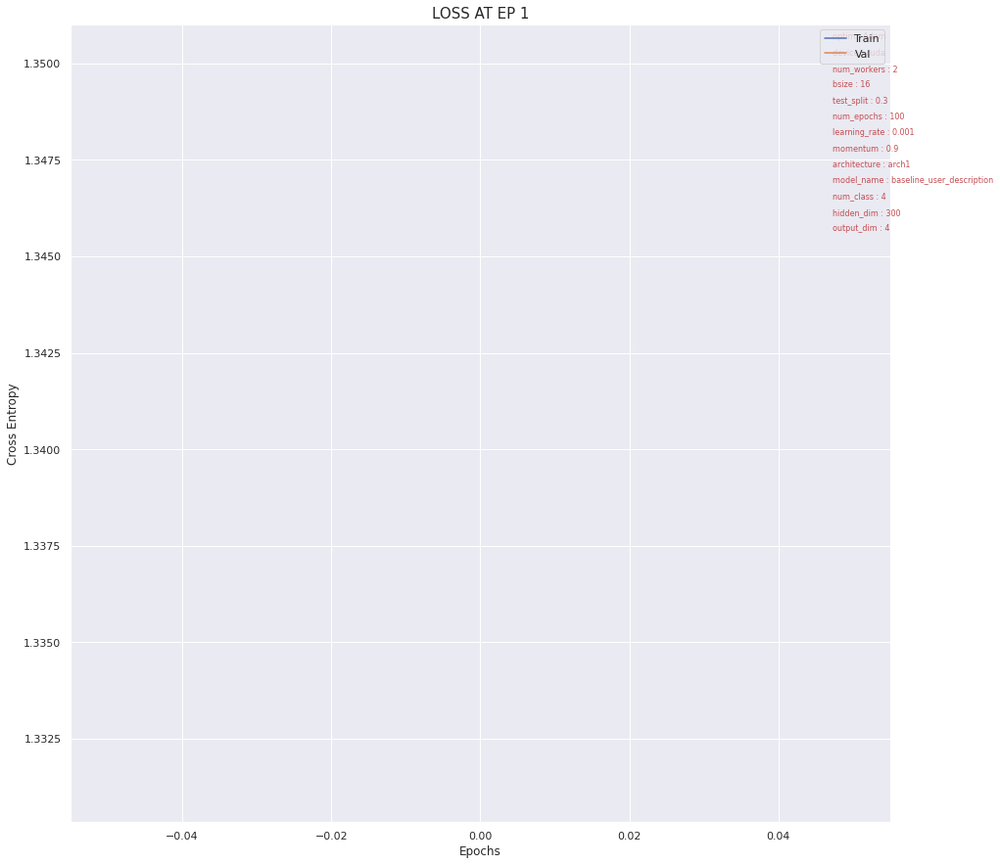

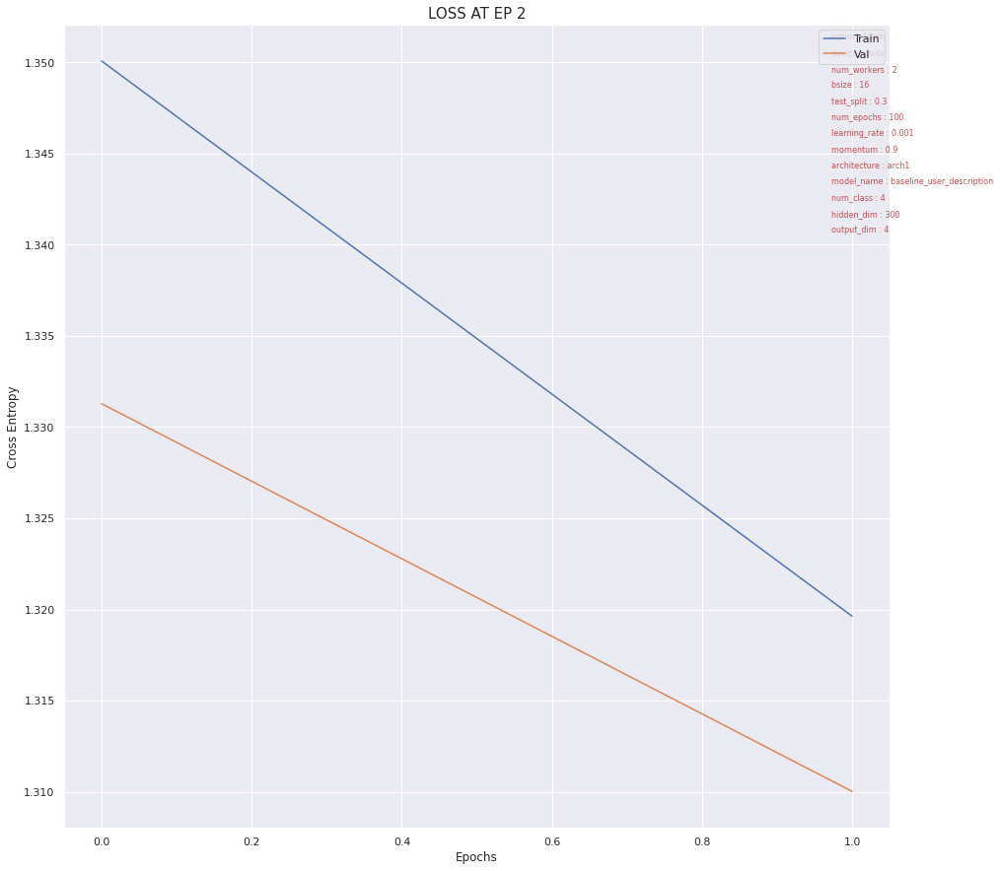

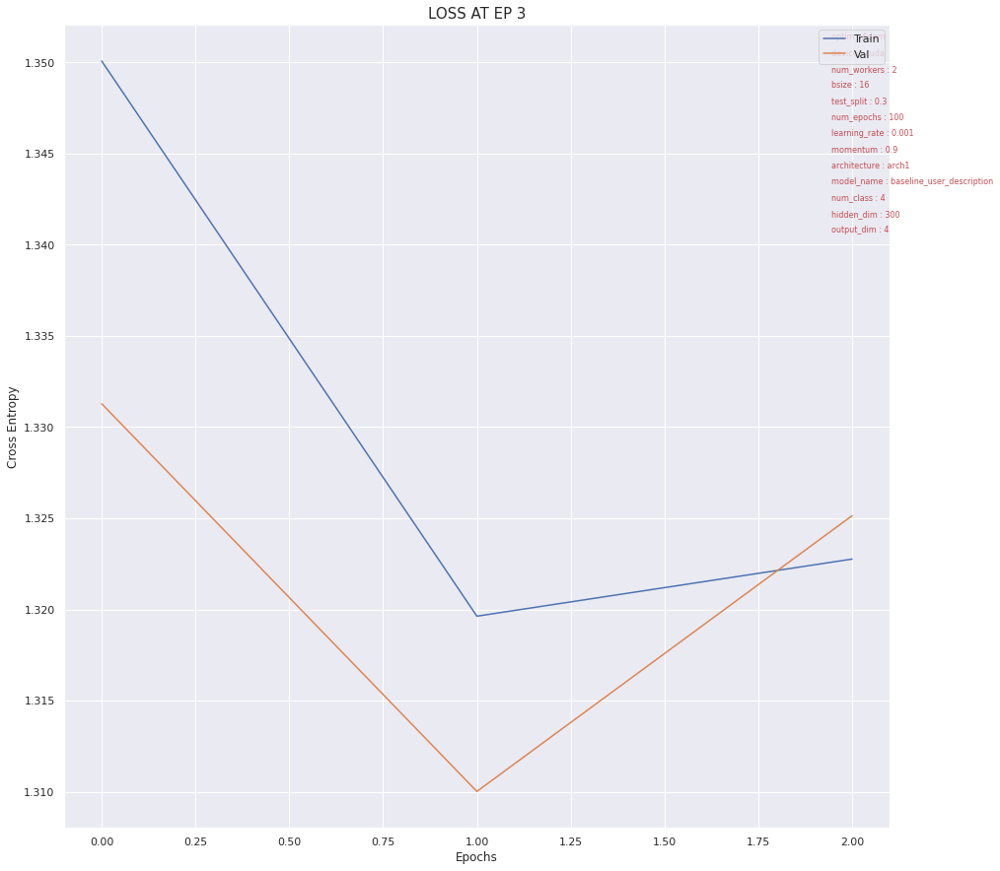

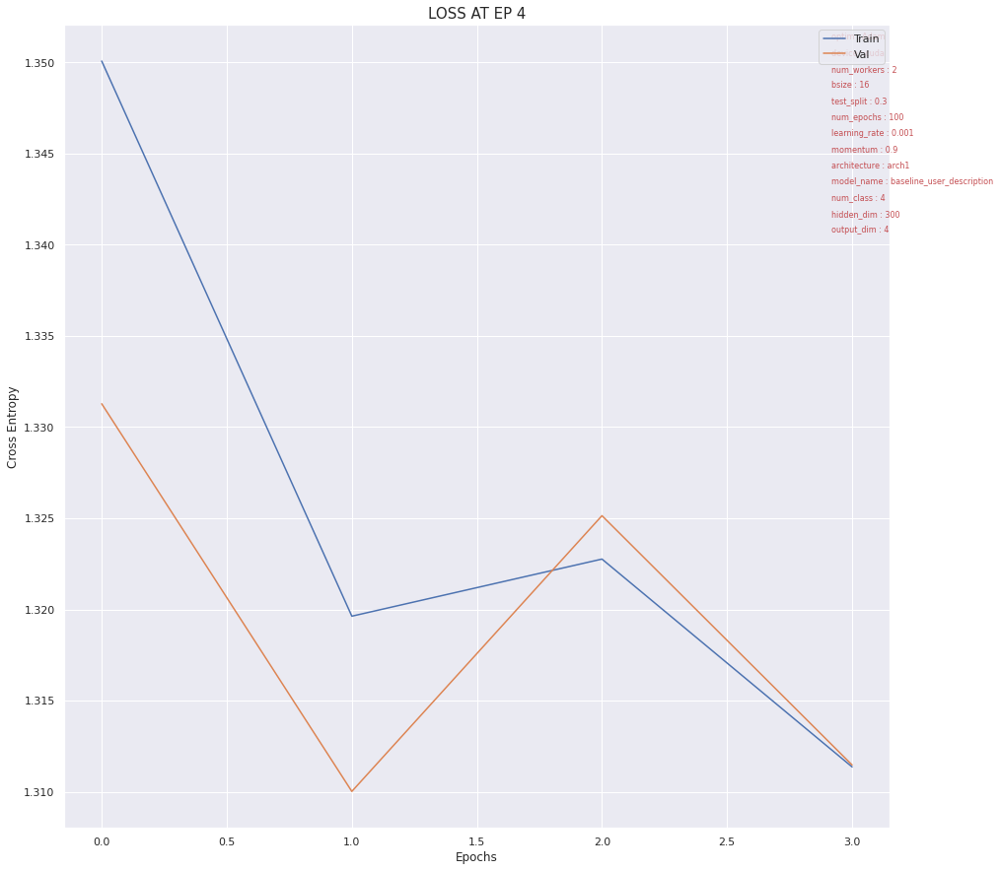

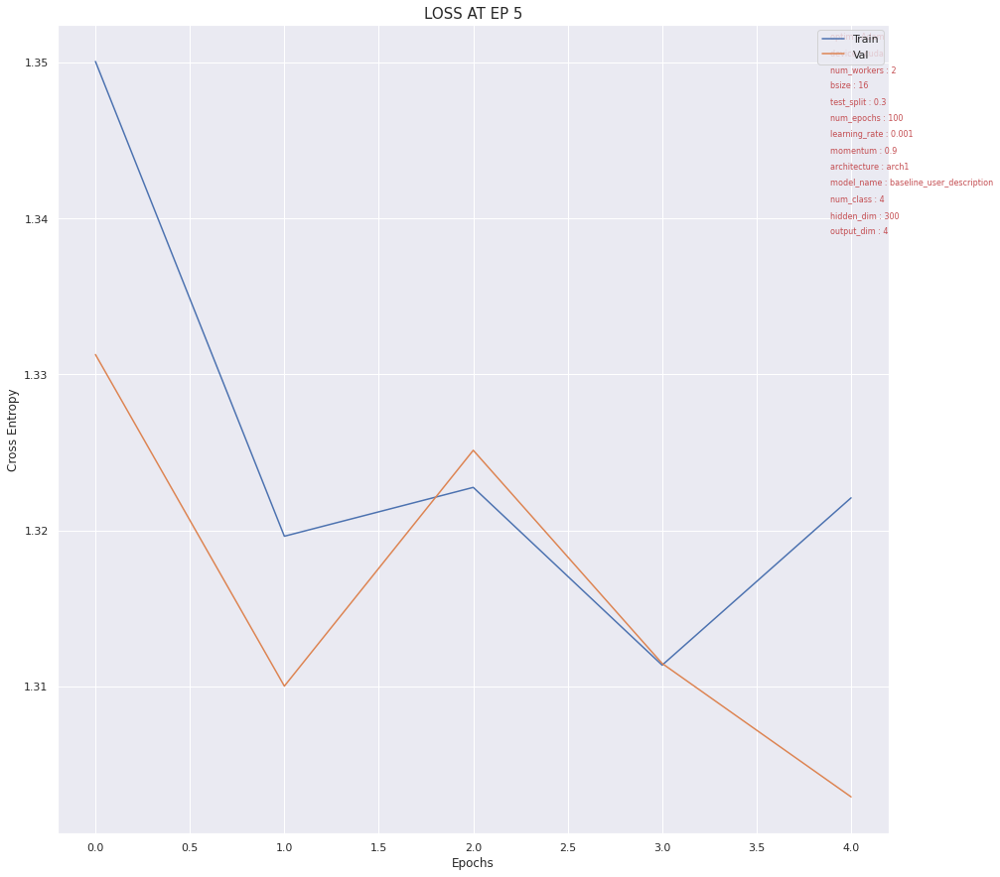

...

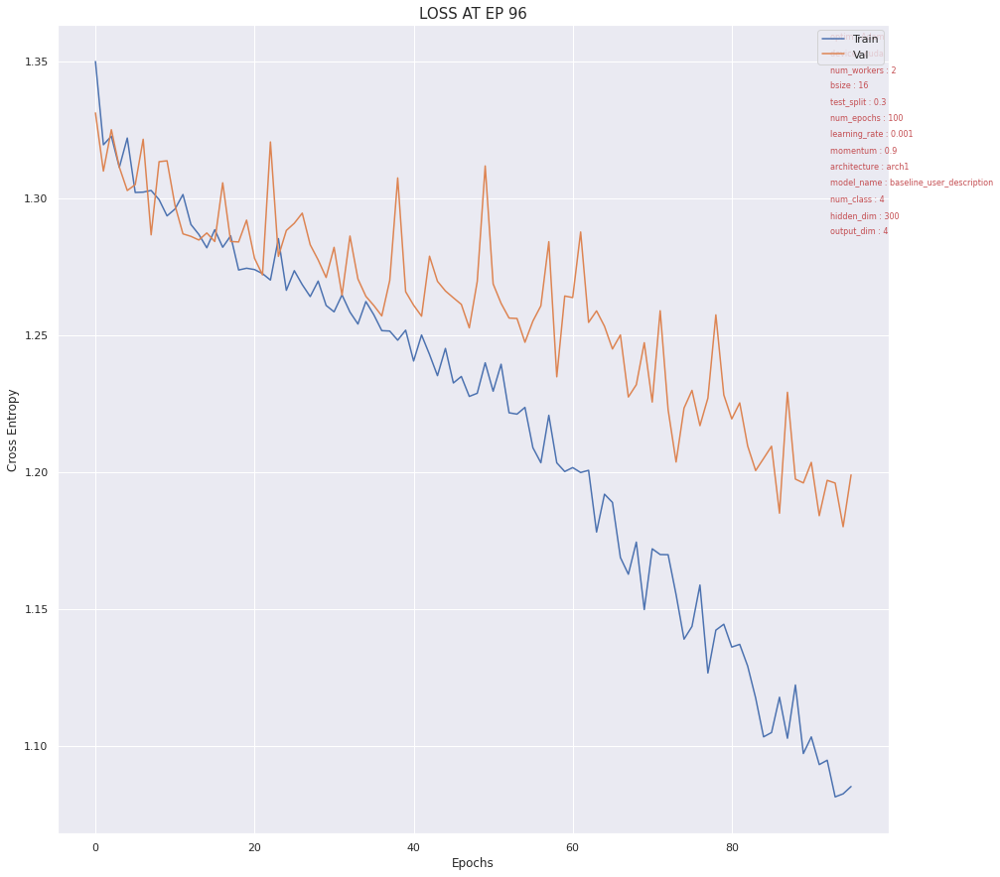

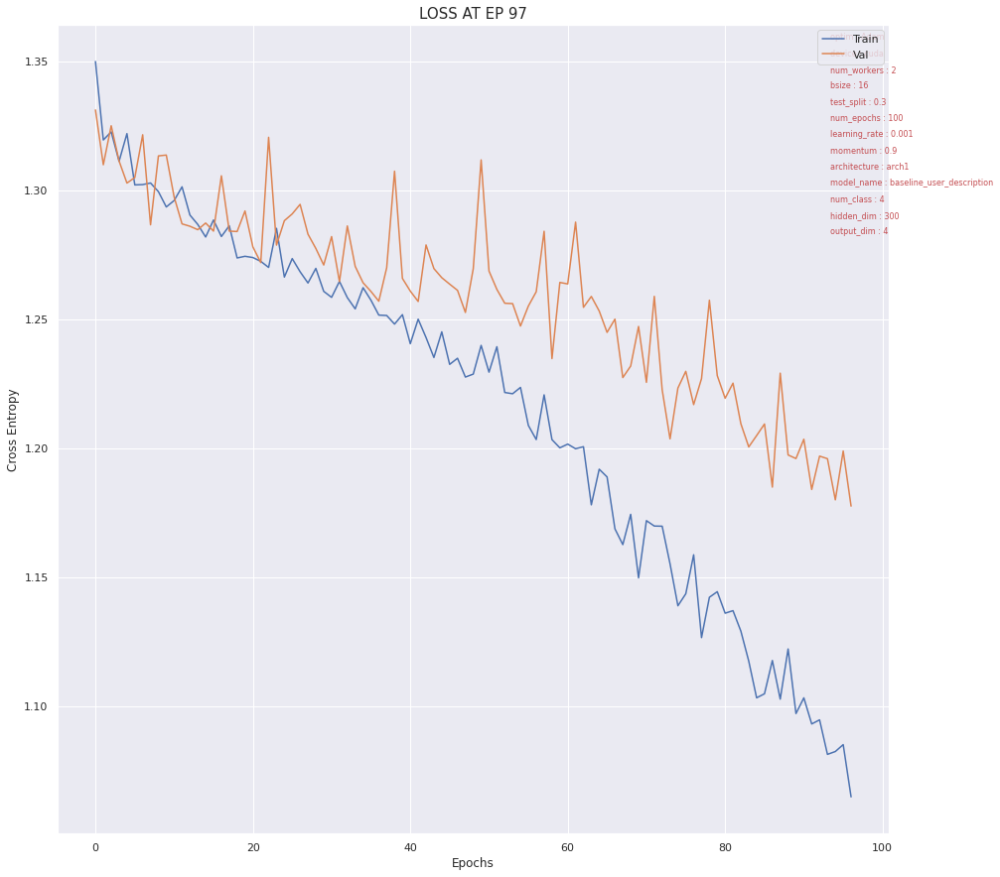

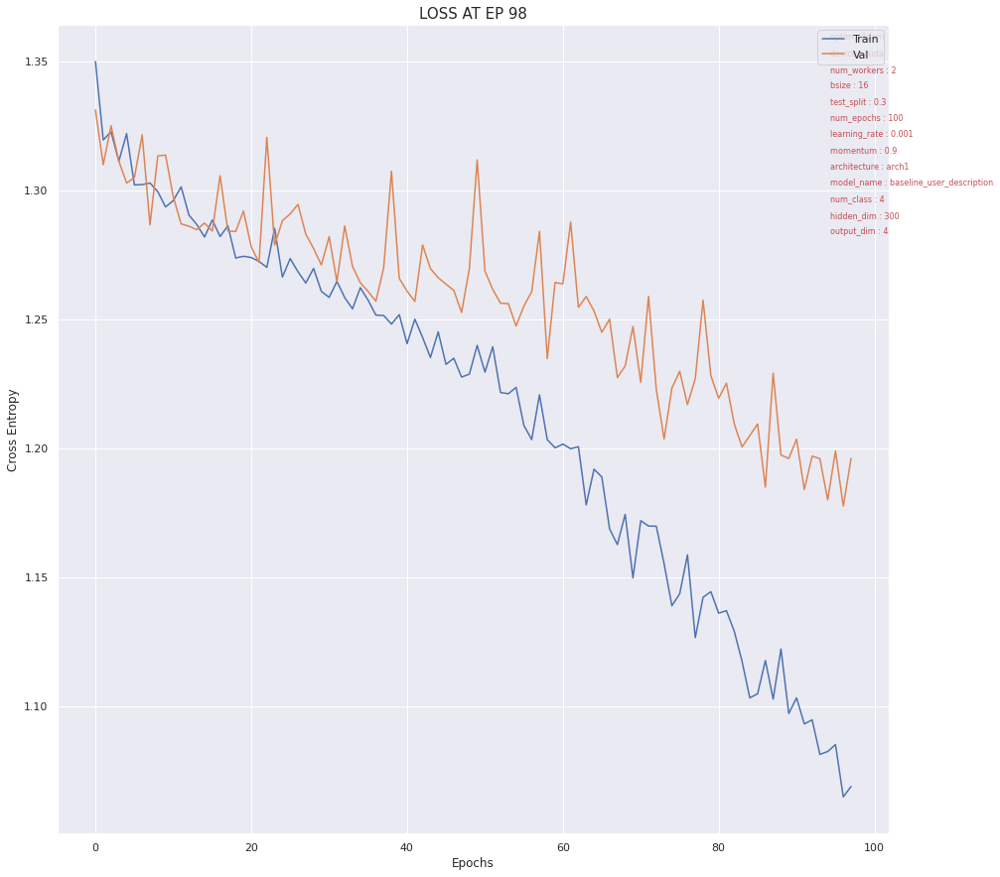

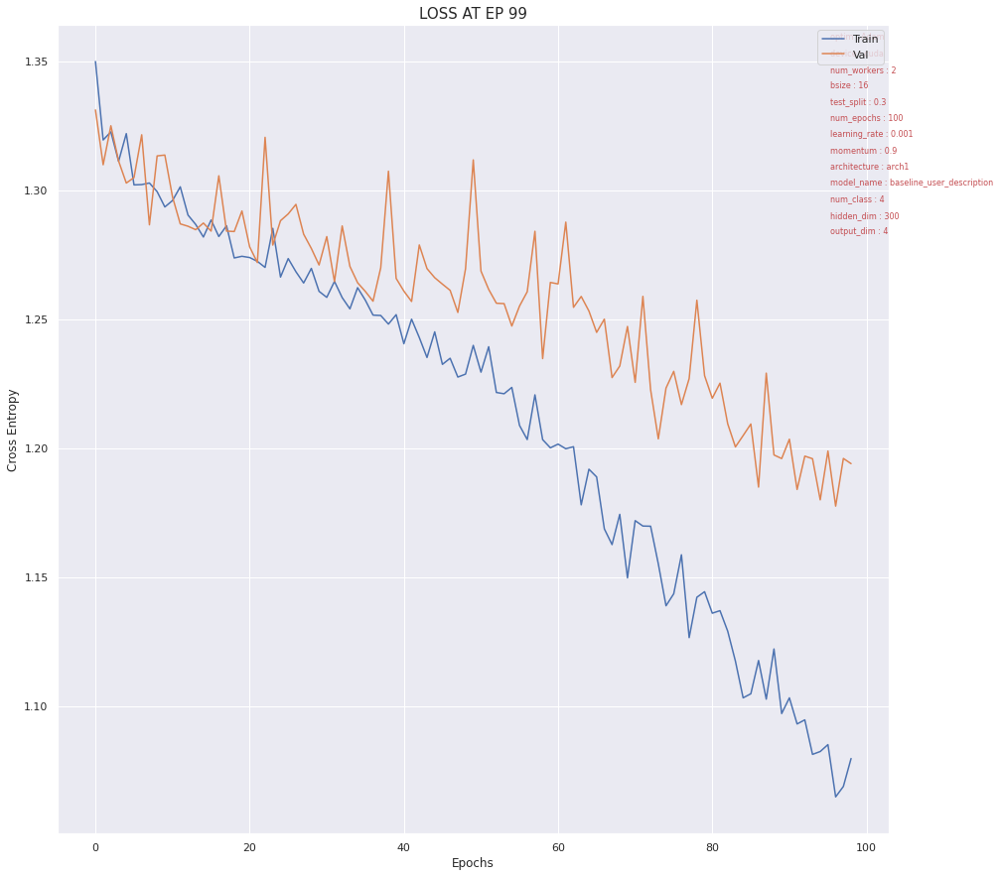

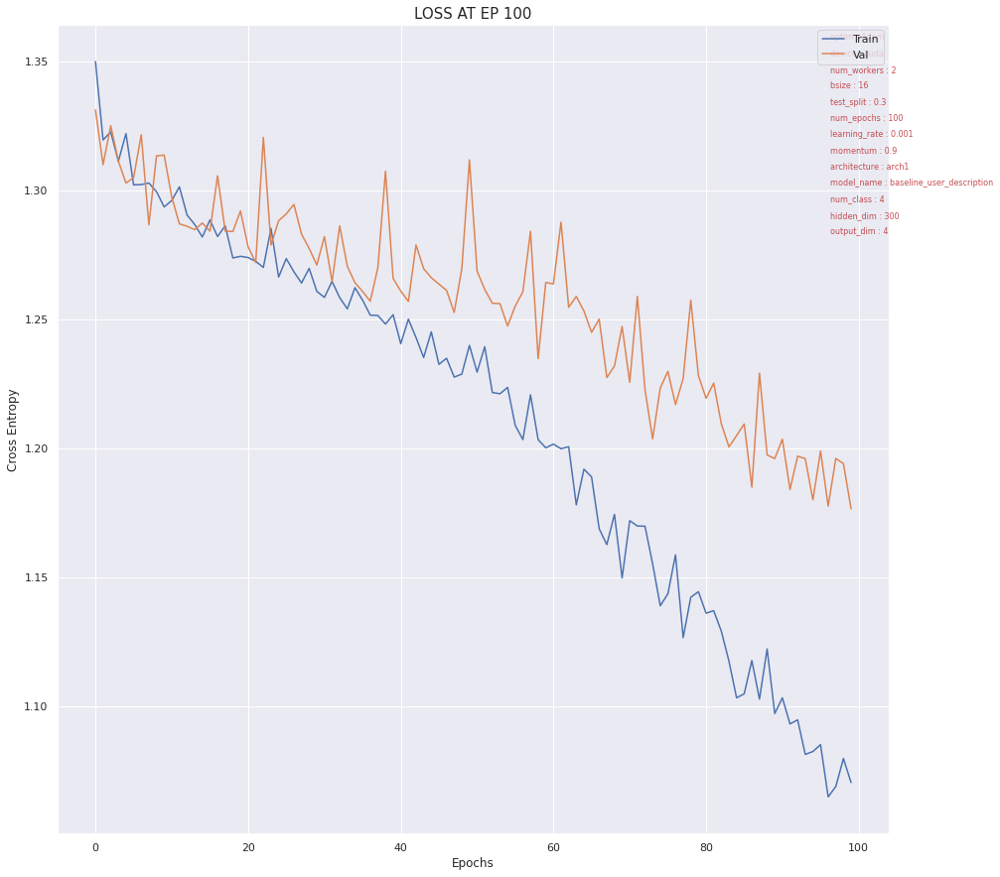

In [ ]:
%run /content/NLP_project/user_location/train/train.py

In [ ]:
with open(f"{output_path}pred.json") as f:
    preds = json.load(f)
    f.close()
label = ["Americas","Europe","Oceania","India"]
print(classification_report(np.array(preds["trues"]).flatten(), np.array(preds["preds"]).flatten(), target_names=label))
print(f"The Overall accuracy of this model is {preds['acc_it_avg']}")

              precision    recall  f1-score   support

    Americas       0.60      0.65      0.62       601
      Europe       0.58      0.64      0.60       599
     Oceania       0.48      0.44      0.46       600
       India       0.61      0.54      0.57       600

    accuracy                           0.57      2400
   macro avg       0.57      0.57      0.57      2400
weighted avg       0.57      0.57      0.57      2400

The Overall accuracy of this model is 0.5675


The results are still disappointing. 

Finally, we think that it could be interesting to apply a NER on the text and to train a model that takes only the identified character as input, for example only persons and locations mentionned. When no such subjects are mentionned, we replace the text by "No Subject". 
Indeed, depending on the label, we expect the subject in the tweet to be different. This can be verified with some wordclouds

### Apply NER on text

Europe :

In [ ]:
from NLP_project.labellisation.utils import apply_ner

100%|██████████| 1237/1237 [00:30<00:00, 39.93it/s]


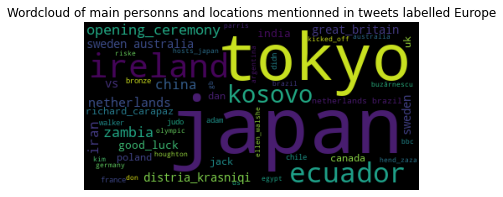

In [ ]:
label = "Europe"
sample = apply_ner(df_labelled[df_labelled["label"] == label],"cleaned_text",l_types = ["GPE","LOC","PERSON","LANGUAGE"])
sample = " ".join([item for sublist in sample for item in sublist])
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud of main personns and locations mentionned in tweets labelled {}".format(label))
plt.axis("off")
plt.show();

India

100%|██████████| 2009/2009 [00:24<00:00, 83.53it/s] 


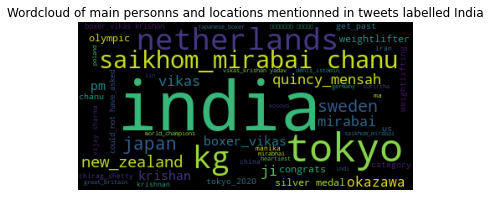

In [ ]:
label = "India"
sample = apply_ner(df_labelled[df_labelled["label"] == label],"cleaned_text",l_types = ["GPE","LOC","PERSON","LANGUAGE"])
sample = " ".join([item for sublist in sample for item in sublist])
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud of main personns and locations mentionned in tweets labelled {}".format(label))
plt.axis("off")
plt.show();

The name Mirabai Chanu (an indian sportwoman) is very present in indian tweets, and we would like to be able to detect it.


Oceania 



100%|██████████| 634/634 [00:07<00:00, 80.62it/s]


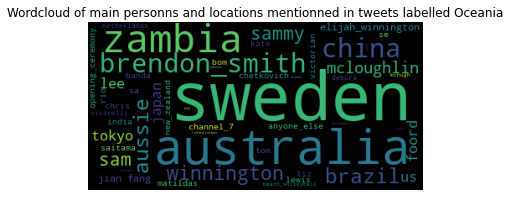

In [ ]:
label = "Oceania"
sample = apply_ner(df_labelled[df_labelled["label"] == label],"cleaned_text",l_types = ["GPE","LOC","PERSON","LANGUAGE"])
sample = " ".join([item for sublist in sample for item in sublist])
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud of main personns and locations mentionned in tweets labelled {}".format(label))
plt.axis("off")
plt.show();

Americas

100%|██████████| 678/678 [00:06<00:00, 98.54it/s] 


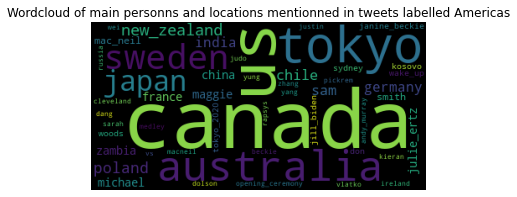

In [ ]:
label = "Americas"
sample = apply_ner(df_labelled[df_labelled["label"] == label],"cleaned_text",l_types = ["GPE","LOC","PERSON","LANGUAGE"])
sample = " ".join([item for sublist in sample for item in sublist])
wordcloud = WordCloud(background_color = "black", max_words = 50).generate(sample)
plt.imshow(wordcloud)
plt.title("Wordcloud of main personns and locations mentionned in tweets labelled {}".format(label))
plt.axis("off")
plt.show();

In [ ]:
{
    "optim": "Adam",
    "device": "cuda",
    "num_workers": 2,
    "bsize": 16,
    "test_split": 0.3,
    "num_epochs": 100,
    "learning_rate": 0.001,
    "momentum": 0.9,
    "architecture": "arch1",
    "model_name": "ner_text",
    "num_class": 4,
    "hidden_dim": 300,
    "output_dim": 4,
    "ner":"ner",
    "column":"cleaned_text"
}

In [ ]:
%run /content/NLP_project/user_location/train/train.py

 20%|██        | 20/100 [01:25<05:25,  4.07s/it]/content/NLP_project/user_location/modelisation/utils.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,15))
100%|██████████| 100/100 [07:02<00:00,  4.22s/it]


In [ ]:
with open(f"{output_path}pred_ner_text.json") as f:
    preds = json.load(f)
    f.close()
label = ["Americas","Europe","Oceania","India"]
print(classification_report(np.array(preds["trues"]).flatten(), np.array(preds["preds"]).flatten(), target_names=label))
print(f"The Overall accuracy of this model is {preds['acc_it_avg']}")

              precision    recall  f1-score   support

    Americas       0.84      0.31      0.46       920
      Europe       0.31      0.87      0.46       920
     Oceania       0.49      0.21      0.29       922
       India       0.57      0.24      0.34       918

    accuracy                           0.41      3680
   macro avg       0.56      0.41      0.39      3680
weighted avg       0.56      0.41      0.39      3680

The Overall accuracy of this model is 0.4076086956521739


The results are not really better. 

### Apply NER on user_description

We do the same on the description column

In [ ]:
{
    "optim": "Adam",
    "device": "cuda",
    "num_workers": 2,
    "bsize": 16,
    "test_split": 0.3,
    "num_epochs": 100,
    "learning_rate": 0.001,
    "momentum": 0.9,
    "architecture": "arch1",
    "model_name": "ner_user_description",
    "num_class": 4,
    "hidden_dim": 300,
    "output_dim": 4,
    "ner":"ner",
    "column":"cleaned_user_description"
}

In [ ]:
%run /content/NLP_project/user_location/train/train.py

  0%|          | 0/100 [00:00<?, ?it/s]/content/NLP_project/user_location/modelisation/utils.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,15))
100%|██████████| 100/100 [07:10<00:00,  4.30s/it]


In [ ]:
with open(f"{output_path}pred.json") as f:
    preds = json.load(f)
    f.close()
label = ["Americas","Europe","Oceania","India"]
print(classification_report(np.array(preds["trues"]).flatten(), np.array(preds["preds"]).flatten(), target_names=label))
print(f"The Overall accuracy of this model is {preds['acc_it_avg']}")

              precision    recall  f1-score   support

    Americas       0.55      0.56      0.55       920
      Europe       0.33      0.68      0.45       919
     Oceania       0.30      0.28      0.29       921
       India       0.80      0.01      0.02       920

    accuracy                           0.38      3680
   macro avg       0.50      0.38      0.33      3680
weighted avg       0.50      0.38      0.33      3680

The Overall accuracy of this model is 0.3826086956521739


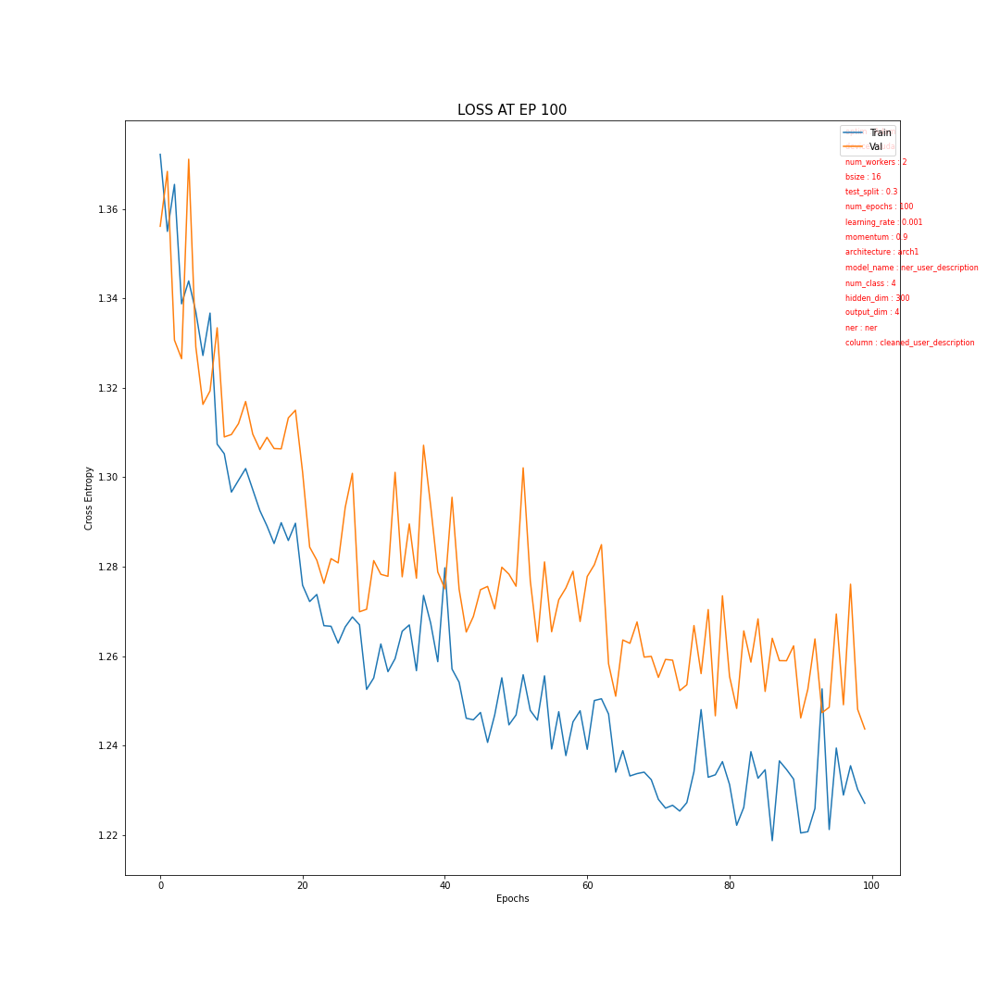

### Conclusion

The training loss did not decrease sufficiently enough. We see however that we have less overfitting, which is a good point.

Finally, we didn't manage to get good enough results. The best accuracy obtained was 0.7. 
We though about other models, such as CNN, or putting fewer possible inputs for the NER approach, based on the wordclouds. 
The problem of this approach is that it is not transferable to other dataset. There is a bias in the texts, because they are talk about the Olympic Games, and it would be difficult to transpose it to another dataset of tweets. 
Maybe, we could have also focus on fewer classes, and try to make a binary prediction, for example "india" against "elsewhere".
Our neural network model might be a bit too "naive" to be trained on these complexe data and to learn the relationship between the text and the localisation, that is not so easy to catch, even for humans with wordclouds. 
We were surprised that the user description and the NER method don't give better results. As claimed above, maybe it would be interesting to restrain the number of tokens associated with NER and to transform the input data in dummies variables with, for example, Marabai Channu, India and Sweden as features, based on the wordclouds. 
Finally, we could have also concat these models and make a final prediction issued from a dense layer at the very end of the network.




# Study on Hashtags

## Preprocessor

We use a dataset with content of the tweet without hashtags on a side, and the related hashtags into a list on the other side. We also discard emojis.  

In [ ]:
dp = DataPreprocessor(df,"text")
df = dp.get_df(to_csv=False, detect_language_=False, remove_emojis=True)

100%|██████████| 15501/15501 [00:01<00:00, 8251.77it/s]


## Labelling

We observe the 20 most common hashtags on the database after a lowcase treatment :


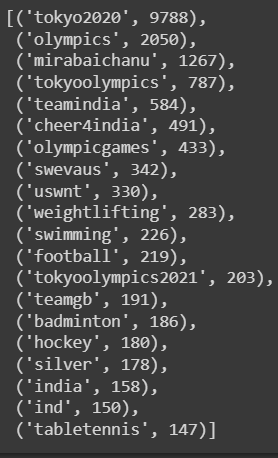

We therefore make our labellisation by keeping the hashtags that are in the above list

In [ ]:
lab = Labelizer(df.dropna(subset = ["hashtags"]), "hashtags")
df_labelled_hashtags = lab.get_df(to_csv=True)

In [ ]:
df_labelled_hashtags.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet,cleaned_text,label
0,1418888645105356803,Abhishek Srivastav,"Udupi, India",Trying to be mediocre in many things,2021-02-01 06:33:51,45,39,293,False,2021-07-24 10:59:49,Let the party begin\n#Tokyo2020,['Tokyo2020'],Twitter for Android,0,0,False,let the party begin,[Tokyo2020]
1,1418888377680678918,Saikhom Mirabai Channu🇮🇳,"Manipur, India",Indian weightlifter 48 kg category. Champion🏆,2018-04-07 10:10:22,5235,5,2969,False,2021-07-24 10:58:45,Congratulations #Tokyo2020 https://t.co/8OFKMs...,['Tokyo2020'],Twitter for Android,0,0,False,congratulations,[Tokyo2020]
4,1418886894478270464,Cameron Hart,Australia,Football & Tennis Coach,2020-10-31 08:46:17,6,37,31,False,2021-07-24 10:52:51,All I can think of every time I watch the ring...,"['Tokyo2020', 'ArtisticGymnastics', '7Olympics...",Twitter for iPhone,0,0,False,all i can think of every time i watch the ring...,[Tokyo2020]
5,1418885092571766792,Sab Joke H,India,Follows you,2020-09-05 19:50:35,107,88,102,False,2021-07-24 10:45:42,#Tokyo2020 #Olympics\n#MirabaiChanu\n#Weightli...,"['Tokyo2020', 'Olympics', 'MirabaiChanu', 'Wei...",Twitter for Android,0,0,False,women empowerment real vs …,"[MirabaiChanu, Olympics, Tokyo2020, Weightlift..."
8,1418889399081656321,International Hockey Federation,Lausanne,Official International Hockey Federation Twitt...,2010-10-20 10:45:59,103976,2724,36554,True,2021-07-24 11:02:49,Q3 1-4 \n\nGreen card for Canada's captain Sc...,"['Tokyo2020', 'CANvGER']",Twitter Web App,0,0,False,q3 🇨_🇦 1-4_🇩 🇪 green_card for canada's captain...,[Tokyo2020]


We harmonize the hashtags and regroup those talking about the same subject but differently written. For example, 'mirabaichanu' and 'mirabhaichanu' or again 'olympics' and 'olympicGames'. Then we create of target variable which list hashtags presented among the 15 most common and plot the number of tweets by hashtag. 

In [ ]:
# Add title and axis names

lst=[]
for i in range(df_labelled_hashtags.shape[0]):
  lst.append(ast.literal_eval(df['hashtags'].iloc[i]))
lst_hash =[item.lower() for sublist in lst for item in sublist]
counter= Counter(lst_hash)
plt.figure(figsize=(8,8
                    ))
plt.title('Occurence des hashtags')
plt.xlabel('hashtags')
plt.ylabel('Nombre d\'occurence')
plt.xticks(rotation = 45)
plt.bar(counter.keys(), counter.values(), color = (0.5,0.1,0.5,0.6))

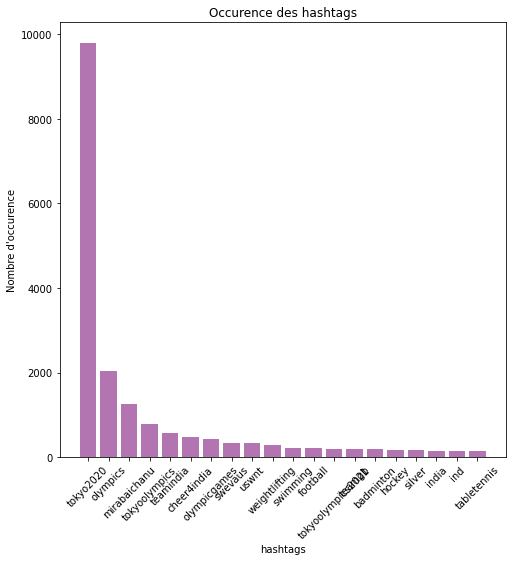

## Descriptive Statistics

We first create dummies variable for each values of the hashtags

In [ ]:
df_dummiesML = df_labelled_hashtags['label'].str.join('|').str.get_dummies()

In [ ]:
df_dummiesML

,Badminton,Football,Hockey,India,MirabaiChanu,Olympics,SWEvAUS,Silver,Swimming,TeamGB,TeamIndia,Tokyo2020,TokyoOlympics,USWNT,Weightlifting
0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1
8,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15496,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
15497,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
15498,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
15499,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


We concatenate these dummies with the initial dataframe to get the text and the other features

In [ ]:
#concaténation
df_labelled_hashtags= pd.concat([df_labelled_hashtags, df_dummiesML], axis=1 )
df_labelled_hashtags = df_labelled_hashtags.loc[:,~df_labelled_hashtags.columns.duplicated()]

In [ ]:
df_labelled_hashtags

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,...,Olympics,SWEvAUS,Silver,Swimming,TeamGB,TeamIndia,Tokyo2020,TokyoOlympics,USWNT,Weightlifting
0,1418888645105356803,Abhishek Srivastav,"Udupi, India",Trying to be mediocre in many things,2021-02-01 06:33:51,45,39,293,False,2021-07-24 10:59:49,...,0,0,0,0,0,0,1,0,0,0
1,1418888377680678918,Saikhom Mirabai Channu🇮🇳,"Manipur, India",Indian weightlifter 48 kg category. Champion🏆,2018-04-07 10:10:22,5235,5,2969,False,2021-07-24 10:58:45,...,0,0,0,0,0,0,1,0,0,0
4,1418886894478270464,Cameron Hart,Australia,Football & Tennis Coach,2020-10-31 08:46:17,6,37,31,False,2021-07-24 10:52:51,...,0,0,0,0,0,0,1,0,0,0
5,1418885092571766792,Sab Joke H,India,Follows you,2020-09-05 19:50:35,107,88,102,False,2021-07-24 10:45:42,...,1,0,0,0,0,0,1,0,0,1
8,1418889399081656321,International Hockey Federation,Lausanne,Official International Hockey Federation Twitt...,2010-10-20 10:45:59,103976,2724,36554,True,2021-07-24 11:02:49,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15496,1418925877958676489,Karthik K,NaN,#sports #gadgets #currentaffairs #tvseries,2009-07-30 17:30:58,181,1047,30479,False,2021-07-24 13:27:46,...,1,0,0,0,0,0,1,0,0,0
15497,1418925853925429268,Prakash,"Allahabad, India",Sab moh maya hai.. 🤔🤔🤔,2020-06-23 19:13:56,25,2294,4605,False,2021-07-24 13:27:40,...,0,0,0,0,0,0,1,0,0,0
15498,1418925846170120193,MaryFrances Vorbach,"Washington, DC",Sports Account. Marketing and media specialist...,2016-08-29 02:00:17,133,281,42871,False,2021-07-24 13:27:38,...,0,0,0,0,0,0,1,0,1,0
15499,1418925839903862792,Karthik K,Toronto,"Passions: Sports (especially the Olympics), Ma...",2010-05-14 04:38:54,2666,295,1038,False,2021-07-24 13:27:37,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
n_hashtags = df_dummiesML.shape[1]

Let's see how these labels are distributed

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


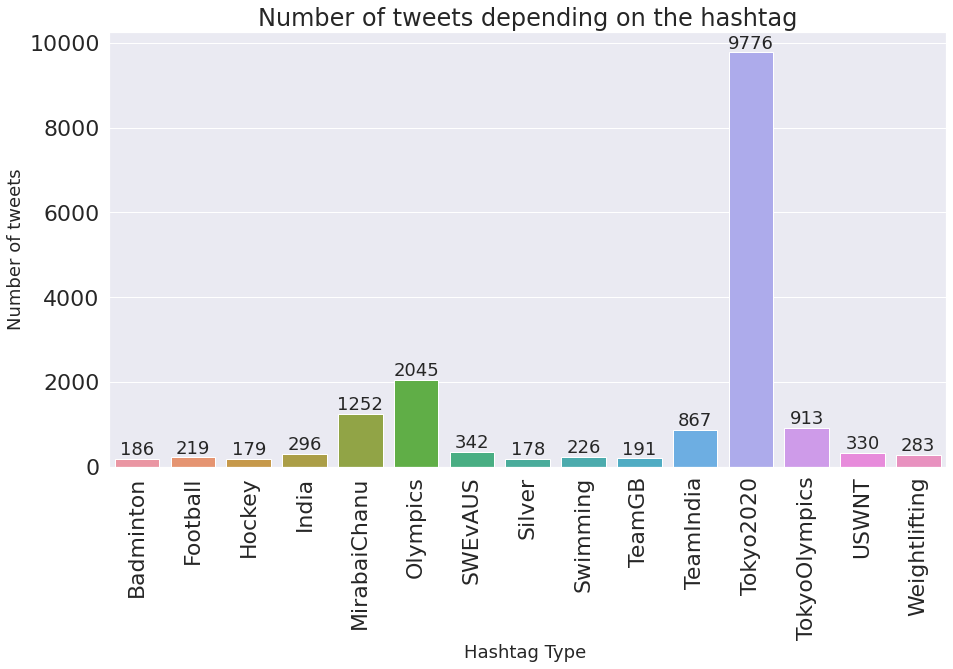

In [ ]:
categories = list(df_labelled_hashtags.iloc[:,-n_hashtags:].columns.values)
sns.set(font_scale = 2)
plt.figure(figsize=(15,8))
ax= sns.barplot(categories, df_labelled_hashtags.iloc[:,-n_hashtags:].sum().values)
plt.title("Number of tweets depending on the hashtag", fontsize=24)
plt.ylabel('Number of tweets', fontsize=18)
plt.xlabel('Hashtag Type ', fontsize=18)
plt.xticks(rotation=90)
#adding the text labels
rects = ax.patches
labels_ = df_labelled_hashtags.iloc[:,-n_hashtags:].sum().values
for rect, label in zip(rects, labels_):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize=18)
plt.show()

How many hashags are there by tweets ? 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


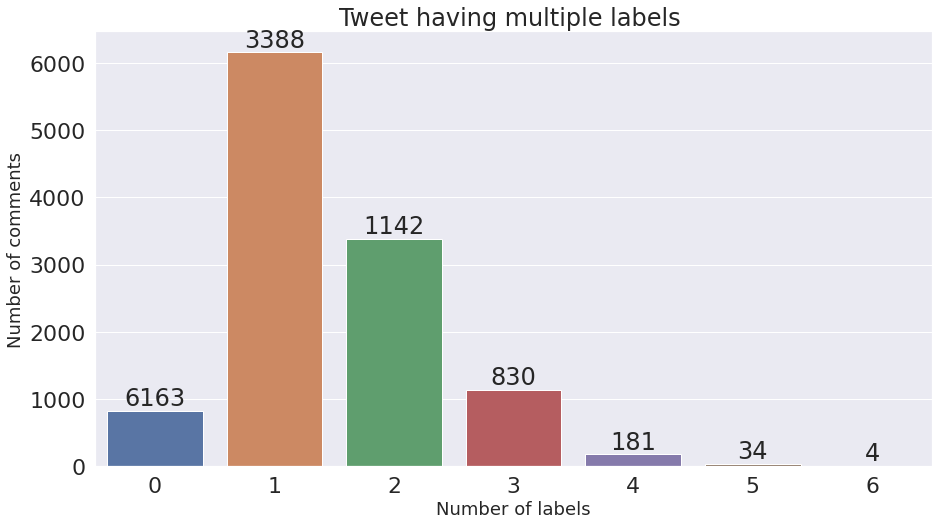

In [ ]:
rowSums = df_labelled_hashtags.iloc[:,-n_hashtags:].sum(axis=1)
multiLabel_counts = rowSums.value_counts()
multiLabel_counts = multiLabel_counts.iloc[:]
sns.set(font_scale = 2)
plt.figure(figsize=(15,8))
ax = sns.barplot(multiLabel_counts.index, multiLabel_counts.values)
plt.title("Tweet having multiple labels ")
plt.ylabel('Number of comments', fontsize=18)
plt.xlabel('Number of labels', fontsize=18)
#adding the text labels
rects = ax.patches
labels = multiLabel_counts.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show()

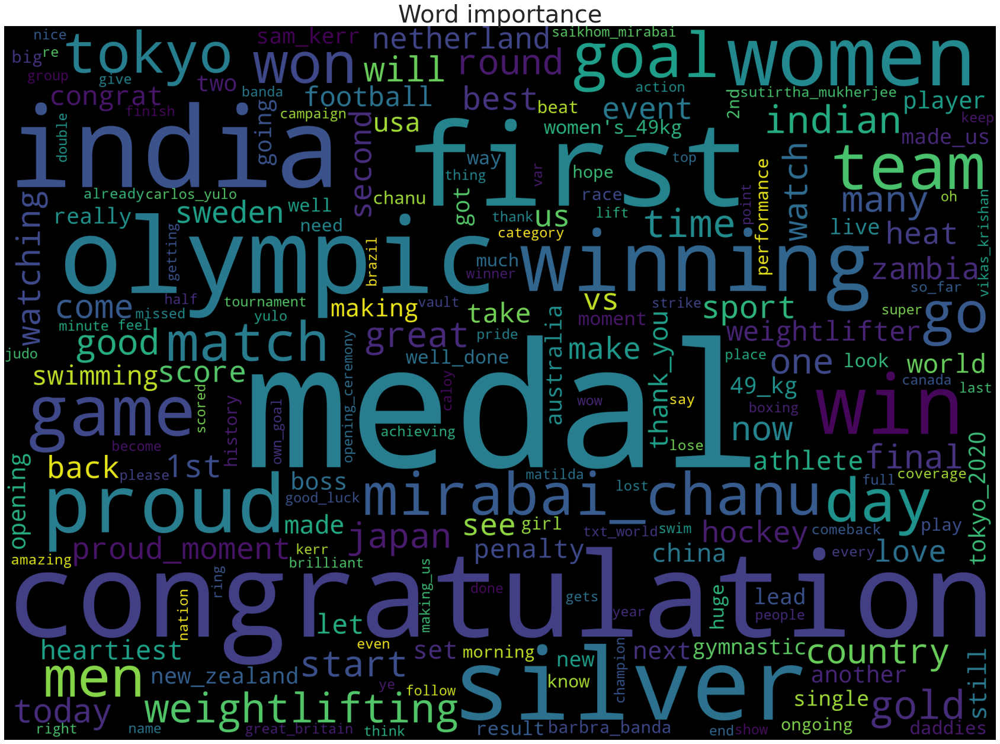

In [ ]:
plt.figure(figsize=(30,25))
# clean
subset = df_labelled_hashtags
text = subset.cleaned_text.values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Word importance",fontsize=40)
plt.imshow(cloud)
plt.show()

## Modelling

### Stemming/stopwords

For our modellisationk we first want to apply another approach and use stemmatisation and stopwords removing. 

In [ ]:
from NLP_project.hashtags.utils import stemming,removeStopWords

In [ ]:
data = df_labelled_hashtags.copy()

Stopwords removing 

In [ ]:
stop_words = set(stopwords.words('english'))
stop_words.update(['tokyo', 'olympics'])
re_stop_words = re.compile(r"\b(" + "|".join(stop_words) + ")\\W", re.I)
data['cleaned_text'] = data['cleaned_text'].apply(removeStopWords)

Stemmatisation

In [ ]:
stemmer = SnowballStemmer("english")
data['cleaned_text'] = data['cleaned_text'].apply(stemming)

Let's check the result

In [ ]:
data["cleaned_text"]

0                                          let parti begin
1                                                congratul
4                      think everi time watch ring event …
5                                  women empower real vs …
8        q3 🇨_🇦 1-4_🇩 🇪 green_card canada captain scott...
                               ...                        
15496                           wow ! ! iran beat poland 😊
15497    excit manipur resid attempt medal nation 🏅 🏅 🏅 at
15498            shout own_goal . disappoint offsid though
15499    pull upset 7th match point upset defend world_...
15500    lake fear street young royal folklor taylor sw...
Name: cleaned_text, Length: 11742, dtype: object

### Databuilding

In [ ]:
data_train, data_test = train_test_split(data, random_state=54, test_size=0.20, shuffle=True)

We want to use now another vectorization, that changes from the previous one. We used therefore the TfidfVectorizer

In [ ]:
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(data_train[["cleaned_text"]])
vectorizer.fit(data_test[["cleaned_text"]])

TfidfVectorizer(ngram_range=(1, 3), strip_accents='unicode')

In [ ]:
x_train = vectorizer.transform(data_train["cleaned_text"])
y_train = data_train.iloc[:,-n_hashtags:]

In [ ]:
x_test = vectorizer.transform(data_test["cleaned_text"])
y_test = data_test.iloc[:,-n_hashtags:]

In [ ]:
x_train.shape[0] == y_train.shape[0]
x_test.shape[0] == y_test.shape[0]

True

### Pipeline for logistic regression

In [ ]:
LogReg_pipeline = Pipeline([
                ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1)),
            ])
d_results = {}
d_preds = {}
for hashtag in categories:
    print('**Processing {} comments...**'.format(hashtag))
    # Training logistic regression model on train data
    LogReg_pipeline.fit(x_train, y_train[hashtag])  
    
    # calculating test accuracy
    prediction = LogReg_pipeline.predict(x_test)
    d_preds[hashtag] = prediction
    accuracy = accuracy_score(y_test[hashtag], prediction)
    d_results[hashtag] = accuracy
    print('Test accuracy is {}'.format(accuracy))
    print("\n")

**Processing Badminton comments...**
Test accuracy is 0.9846743295019157


**Processing Football comments...**
Test accuracy is 0.979565772669221


**Processing Hockey comments...**
Test accuracy is 0.988931460195828


**Processing India comments...**
Test accuracy is 0.9702000851426139


**Processing MirabaiChanu comments...**
Test accuracy is 0.8935717326521925


**Processing Olympics comments...**
Test accuracy is 0.8139633886760324


**Processing SWEvAUS comments...**
Test accuracy is 0.9719029374201787


**Processing Silver comments...**
Test accuracy is 0.9855257556406982


**Processing Swimming comments...**
Test accuracy is 0.9804171988080034


**Processing TeamGB comments...**
Test accuracy is 0.9851000425713069


**Processing TeamIndia comments...**
Test accuracy is 0.9220945083014048


**Processing Tokyo2020 comments...**
Test accuracy is 0.8305661983822903


**Processing TokyoOlympics comments...**
Test accuracy is 0.9199659429544487


**Processing USWNT comments...**
Test 

In [ ]:
pd.DataFrame(d_results, index = [0])

,Badminton,Football,Hockey,India,MirabaiChanu,Olympics,SWEvAUS,Silver,Swimming,TeamGB,TeamIndia,Tokyo2020,TokyoOlympics,USWNT,Weightlifting
0,0.984674,0.979566,0.988931,0.9702,0.893572,0.813963,0.971903,0.985526,0.980417,0.9851,0.922095,0.830566,0.919966,0.968923,0.977437


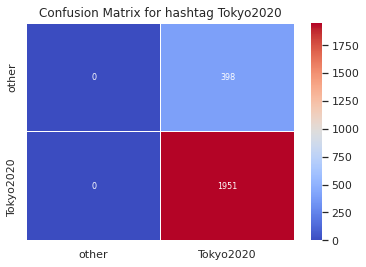

In [ ]:
hashtag  = "Tokyo2020"
plt.figure()
cm = confusion_matrix(y_test[hashtag], d_preds[hashtag])
df_cm = pd.DataFrame(cm, index = ["other", hashtag], columns = ["other", hashtag])
# config plot sizes
sns.set(font_scale=1)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 8}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.title("Confusion Matrix for hashtag {}".format(hashtag))
plt.show()

THe results are really good. The logstic regression was able to predict almost all hashtags with an accuracy up to 0.95. 
We observe a negative correlation between the accuracy of the result and the popularity of the hashtag. Indeed, the more a hashtag is used, the worse predicted it is. The "Tokyo2020" hashtag is maybe the best example of that. 

# Study on Emojis

To conclude, we would like to study how the emojis are used in the database. For this purpose, we use the NER with a special package "Emoji"

In [5]:
from NLP_project.hashtags.utils import extract_emojies

In [16]:
nlp = spacy.load("en_core_web_sm")
emoji = Emoji(nlp)
nlp.add_pipe("emoji", first=True)
emo = functools.partial(extract_emojies,nlp=nlp)

In [ ]:
emojies_df = df.apply(emo,axis=1)
emoji_counts = (emojies_df
                .apply(pd.Series)
                .stack()
                .value_counts()
                .rename('Count')
                .sort_values()
                .reset_index()
                .rename(columns={'index':'Emoji'}))

top15 = emoji_counts.sort_values(by=['Count'], ascending=False).head(15)

fig = go.Figure()

fig.add_trace(go.Scatter(y=top15['Emoji'],
                x=top15['Count'],
                name='Emoji Counts',
                marker_color='white',
                orientation='h',
                text=top15['Emoji'],
                textposition='top center',
                mode='markers+text',
                textfont=dict(size=30),
                ))

fig.update_yaxes(visible =False, range=[0, len(top15)+1])
fig.update_xaxes(title='Number of Times the emji is Used')

fig.update_layout(
    template='simple_white', 
    height=len(top15)*75, width = 800)

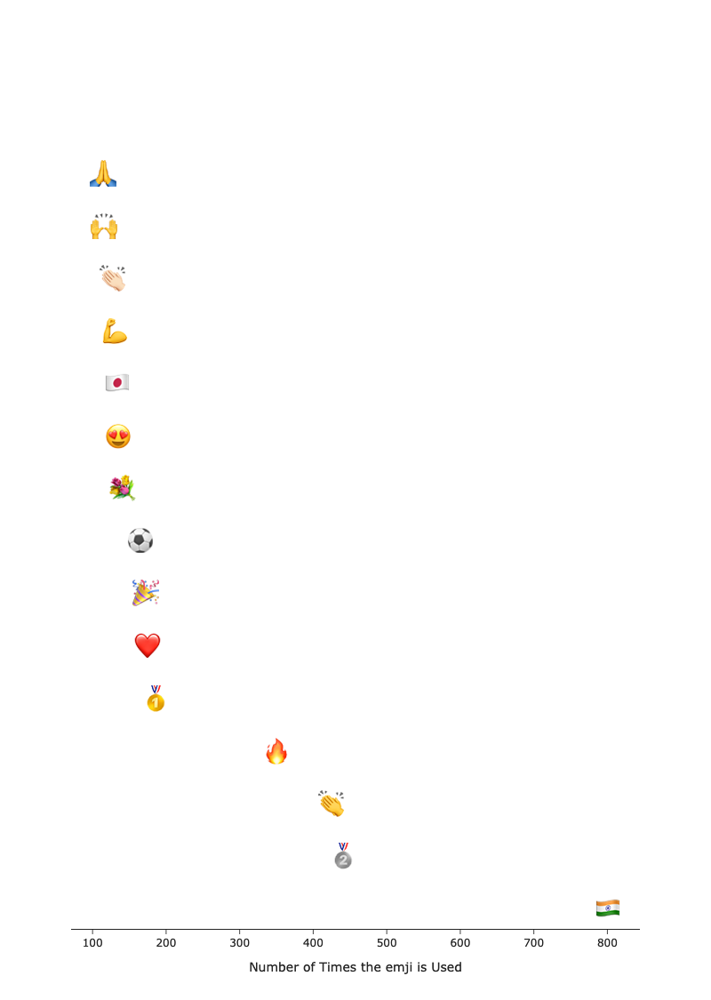